# Model Evaluation Notebook
This notebook loads a trained pyramidal model checkpoint and performs test predictions with visualizations.

In [37]:
import sys
sys.path.append('..')

import torch
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, precision_recall_curve, average_precision_score, roc_curve, auc
from torchvision.datasets import ImageFolder
import torchvision.transforms.v2 as F
from torch.utils.data import DataLoader
from models.complex_models.pyramidal_dense_descriptor_classifier_v2 import make_double_descriptor_prototype_gran_normal
from utils import InMemoryDataset
import random

## Configuration

In [38]:
# Model configuration
MODEL_PATH = '../trained_models/pyramidal_gran_normal/best_test_accuracy.pt'
IMG_SIZE = 224
DROPOUT = 0.1  # Should match the model that was trained
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

print(f"Using device: {DEVICE}")

Using device: cuda


## Load Test Dataset

In [39]:
# Load test data
torch.manual_seed(42)

test_transformation = F.Compose([
    F.ToDtype(torch.float32, scale=True),
    F.Resize(size=(IMG_SIZE, IMG_SIZE)),
])

# Load original dataset to get class names and for visualization
test_dataset_original = ImageFolder("../../data/places_reduced/val")
class_names = test_dataset_original.classes
print(f"Classes: {class_names}")

# Create in-memory dataset for fast evaluation
test_dataset = InMemoryDataset(test_dataset_original, DEVICE, transform=test_transformation)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False, num_workers=0)

Classes: ['commercial buildings', 'forest_field_jungle', 'home or hotel', 'houses_cabins_gardens_farms', 'industrial and construction', 'mountains_hills_desert_sky', 'shopping and dining', 'sports and leisure', 'sports_fields', 'water_ice_snow', 'workplace']


## Load Model Checkpoint

In [40]:
# Create model architecture
model = make_double_descriptor_prototype_gran_normal(dropout=DROPOUT)
model = model.to(DEVICE)

# Load checkpoint
checkpoint = torch.load(MODEL_PATH, map_location=DEVICE, weights_only=False)

# Load model state
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()

print(f"Model loaded from epoch {checkpoint['epoch']}")
print(f"Model architecture:\n{model}")

Model loaded from epoch 265
Model architecture:
DoubleDescriptorClassifier(
  (patch_description_head): PatchDescriptionBlock(
    (description): Sequential(
      (0): Linear(in_features=768, out_features=128, bias=True)
      (1): GELU(approximate='none')
      (2): Dropout(p=0.1, inplace=False)
      (3): Linear(in_features=128, out_features=128, bias=True)
      (4): GELU(approximate='none')
    )
  )
  (image_descriptor_head): Sequential(
    (0): PatchDescriptionBlock(
      (description): Sequential(
        (0): Linear(in_features=6272, out_features=512, bias=True)
        (1): GELU(approximate='none')
        (2): Dropout(p=0.1, inplace=False)
        (3): Linear(in_features=512, out_features=512, bias=True)
        (4): GELU(approximate='none')
      )
    )
    (1): PatchDescriptionBlock(
      (description): Sequential(
        (0): Linear(in_features=2048, out_features=1024, bias=True)
        (1): GELU(approximate='none')
        (2): Dropout(p=0.1, inplace=False)
       

## Evaluate Model on Test Set

In [41]:
# Collect all predictions and ground truth labels
all_preds = []
all_labels = []
all_probs = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs = inputs.to(DEVICE)
        labels = labels.to(DEVICE)
        
        outputs = model(inputs)
        probs = torch.softmax(outputs, dim=1)
        _, preds = outputs.max(1)
        
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        all_probs.extend(probs.cpu().numpy())

all_preds = np.array(all_preds)
all_labels = np.array(all_labels)
all_probs = np.array(all_probs)

# Calculate accuracy
accuracy = (all_preds == all_labels).mean()
print(f"\nTest Accuracy: {accuracy:.4f}")


Test Accuracy: 0.4309


## Confusion Matrix Visualization

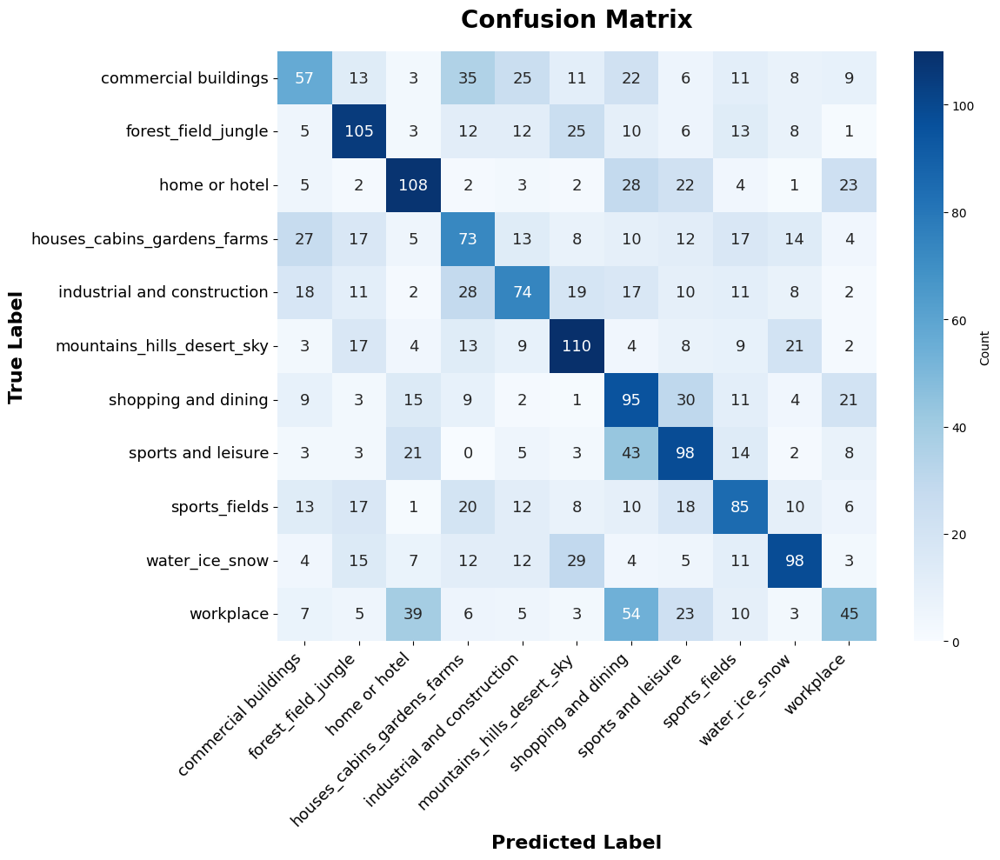

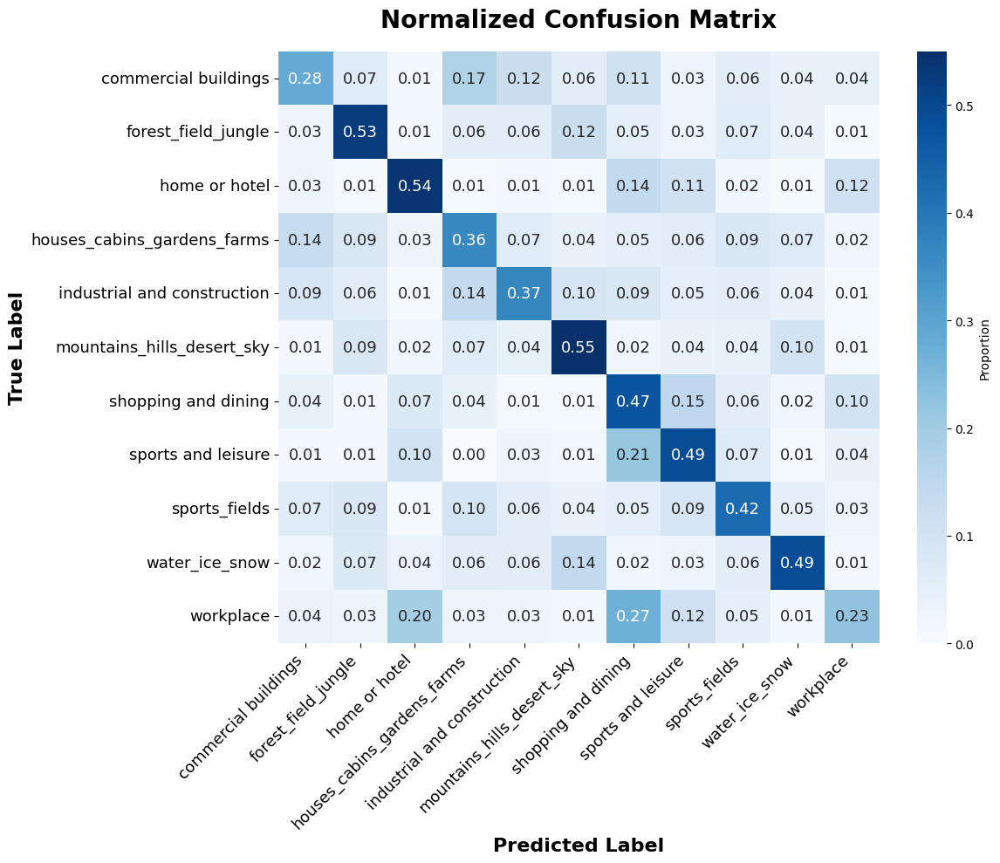

In [42]:
# Compute confusion matrix
cm = confusion_matrix(all_labels, all_preds)

# Plot confusion matrix
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_names, yticklabels=class_names,
            cbar_kws={'label': 'Count'},
            annot_kws={'fontsize': 13})
plt.title('Confusion Matrix', fontsize=20, pad=20, fontweight='bold')
plt.ylabel('True Label', fontsize=16, fontweight='bold')
plt.xlabel('Predicted Label', fontsize=16, fontweight='bold')
plt.xticks(rotation=45, ha='right', fontsize=13)
plt.yticks(rotation=0, fontsize=13)
plt.tight_layout()
plt.show()

# Normalized confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

plt.figure(figsize=(12, 10))
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names,
            cbar_kws={'label': 'Proportion'},
            annot_kws={'fontsize': 13})
plt.title('Normalized Confusion Matrix', fontsize=20, pad=20, fontweight='bold')
plt.ylabel('True Label', fontsize=16, fontweight='bold')
plt.xlabel('Predicted Label', fontsize=16, fontweight='bold')
plt.xticks(rotation=45, ha='right', fontsize=13)
plt.yticks(rotation=0, fontsize=13)
plt.tight_layout()
plt.show()

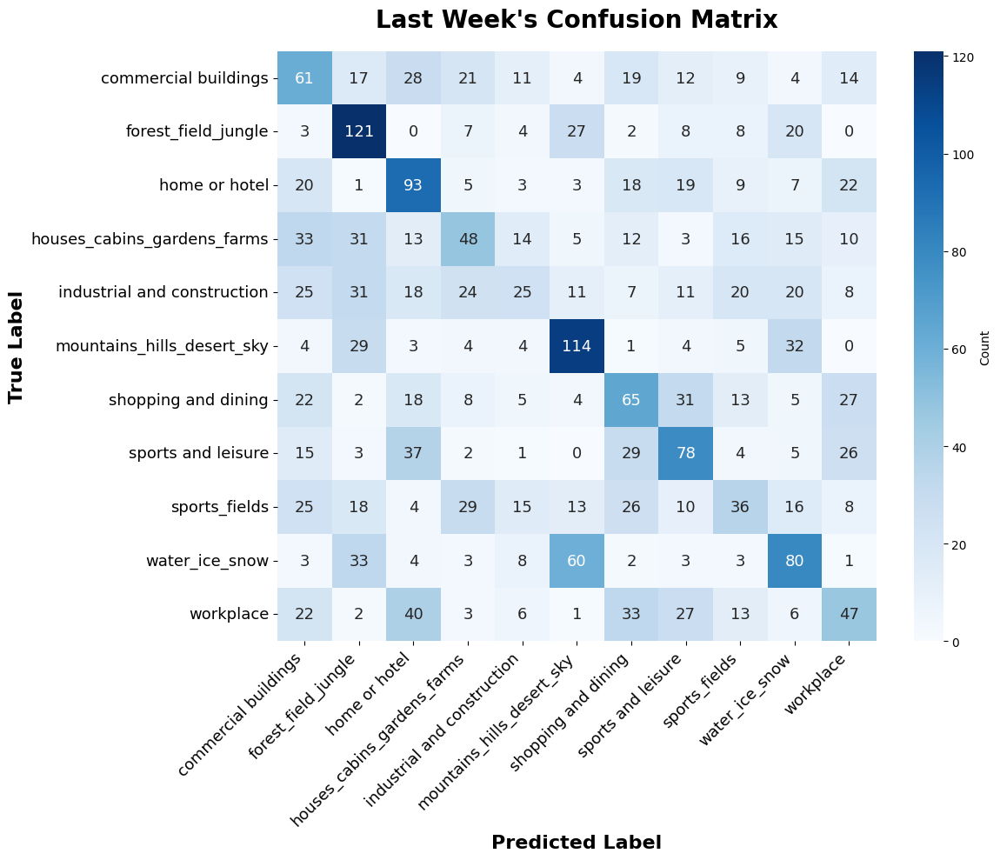

In [43]:
confusion_matrix_last_week = [
    [61, 17, 28, 21, 11, 4, 19, 12, 9, 4, 14],
    [3, 121, 0, 7, 4, 27, 2, 8, 8, 20, 0],
    [20, 1, 93, 5, 3, 3, 18, 19, 9, 7, 22],
    [33, 31, 13, 48, 14, 5, 12, 3, 16, 15, 10],
    [25, 31, 18, 24, 25, 11, 7, 11, 20, 20, 8],
    [4, 29, 3, 4, 4, 114, 1, 4, 5, 32, 0],
    [22, 2, 18, 8, 5, 4, 65, 31, 13, 5, 27],
    [15, 3, 37, 2, 1, 0, 29, 78, 4, 5, 26],
    [25, 18, 4, 29, 15, 13, 26, 10, 36, 16, 8],
    [3, 33, 4, 3, 8, 60, 2, 3, 3, 80, 1],
    [22, 2, 40, 3, 6, 1, 33, 27, 13, 6, 47],
]

plt.figure(figsize=(12, 10))
sns.heatmap(confusion_matrix_last_week, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_names, yticklabels=class_names,
            cbar_kws={'label': 'Count'},
            annot_kws={'fontsize': 13})
plt.title('Last Week\'s Confusion Matrix', fontsize=20, pad=20, fontweight='bold')
plt.ylabel('True Label', fontsize=16, fontweight='bold')
plt.xlabel('Predicted Label', fontsize=16, fontweight='bold')
plt.xticks(rotation=45, ha='right', fontsize=13)
plt.yticks(rotation=0, fontsize=13)
plt.tight_layout()
plt.show()

## Per-Class Performance Metrics

Classification Report:
                             precision    recall  f1-score   support

       commercial buildings     0.3775    0.2850    0.3248       200
        forest_field_jungle     0.5048    0.5250    0.5147       200
              home or hotel     0.5192    0.5400    0.5294       200
houses_cabins_gardens_farms     0.3476    0.3650    0.3561       200
industrial and construction     0.4302    0.3700    0.3978       200
 mountains_hills_desert_sky     0.5023    0.5500    0.5251       200
        shopping and dining     0.3199    0.4750    0.3823       200
         sports and leisure     0.4118    0.4900    0.4475       200
              sports_fields     0.4337    0.4250    0.4293       200
             water_ice_snow     0.5537    0.4900    0.5199       200
                  workplace     0.3629    0.2250    0.2778       200

                   accuracy                         0.4309      2200
                  macro avg     0.4330    0.4309    0.4277      2200
         

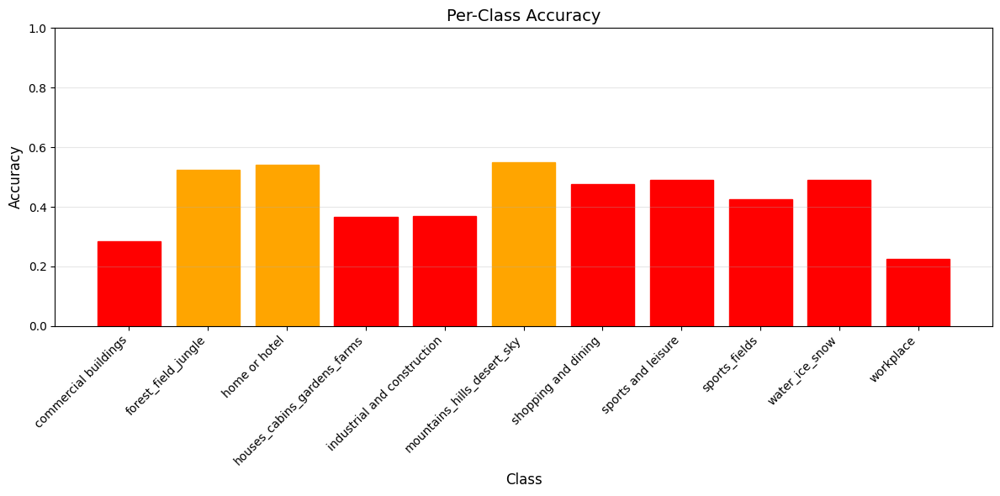


Per-Class Accuracy:
commercial buildings: 0.2850
forest_field_jungle : 0.5250
home or hotel       : 0.5400
houses_cabins_gardens_farms: 0.3650
industrial and construction: 0.3700
mountains_hills_desert_sky: 0.5500
shopping and dining : 0.4750
sports and leisure  : 0.4900
sports_fields       : 0.4250
water_ice_snow      : 0.4900
workplace           : 0.2250


In [44]:
# Classification report
print("Classification Report:")
print("=" * 80)
print(classification_report(all_labels, all_preds, target_names=class_names, digits=4))

# Per-class accuracy
per_class_accuracy = cm.diagonal() / cm.sum(axis=1)

plt.figure(figsize=(12, 6))
bars = plt.bar(range(len(class_names)), per_class_accuracy)
plt.xlabel('Class', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.title('Per-Class Accuracy', fontsize=14)
plt.xticks(range(len(class_names)), class_names, rotation=45, ha='right')
plt.ylim([0, 1])
plt.grid(axis='y', alpha=0.3)

# Color bars by performance
for i, bar in enumerate(bars):
    if per_class_accuracy[i] >= 0.7:
        bar.set_color('green')
    elif per_class_accuracy[i] >= 0.5:
        bar.set_color('orange')
    else:
        bar.set_color('red')

plt.tight_layout()
plt.show()

# Print per-class statistics
print("\nPer-Class Accuracy:")
print("=" * 50)
for i, class_name in enumerate(class_names):
    print(f"{class_name:20s}: {per_class_accuracy[i]:.4f}")

## Precision-Recall Curves

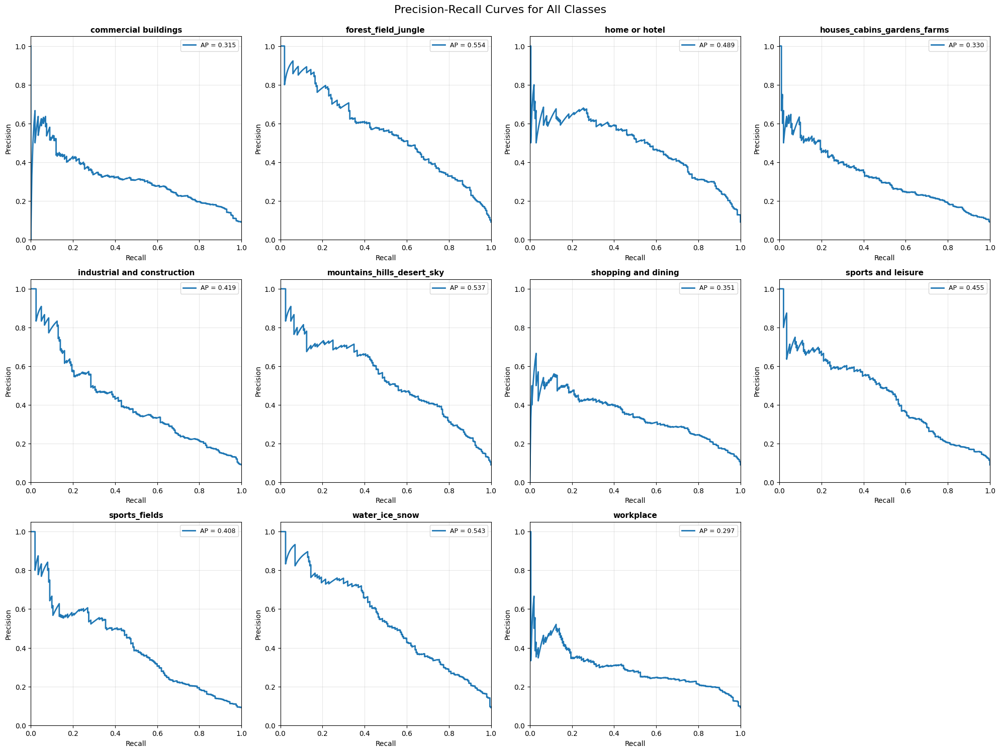


Average Precision (AP) Scores:
commercial buildings               : 0.3153
forest_field_jungle                : 0.5545
home or hotel                      : 0.4891
houses_cabins_gardens_farms        : 0.3297
industrial and construction        : 0.4194
mountains_hills_desert_sky         : 0.5369
shopping and dining                : 0.3505
sports and leisure                 : 0.4550
sports_fields                      : 0.4083
water_ice_snow                     : 0.5426
workplace                          : 0.2966

Mean Average Precision (mAP)       : 0.4271


In [45]:
# Compute PR curves for all classes
from sklearn.preprocessing import label_binarize

# Binarize the labels for multi-class PR curve
y_true_bin = label_binarize(all_labels, classes=range(len(class_names)))

# Compute precision-recall curve and average precision for each class
precision = dict()
recall = dict()
average_precision = dict()

for i in range(len(class_names)):
    precision[i], recall[i], _ = precision_recall_curve(y_true_bin[:, i], all_probs[:, i])
    average_precision[i] = average_precision_score(y_true_bin[:, i], all_probs[:, i])

# Plot PR curves for all classes
fig, axes = plt.subplots(3, 4, figsize=(20, 15))
axes = axes.flatten()

for i in range(len(class_names)):
    ax = axes[i]
    ax.plot(recall[i], precision[i], linewidth=2, label=f'AP = {average_precision[i]:.3f}')
    ax.set_xlabel('Recall', fontsize=10)
    ax.set_ylabel('Precision', fontsize=10)
    ax.set_title(f'{class_names[i]}', fontsize=11, fontweight='bold')
    ax.legend(loc='best', fontsize=9)
    ax.grid(alpha=0.3)
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])

# Hide the last subplot (we have 11 classes, 12 subplots)
axes[-1].axis('off')

plt.suptitle('Precision-Recall Curves for All Classes', fontsize=16, y=0.995)
plt.tight_layout()
plt.show()

# Print average precision scores
print("\nAverage Precision (AP) Scores:")
print("=" * 50)
for i, class_name in enumerate(class_names):
    print(f"{class_name:35s}: {average_precision[i]:.4f}")
print(f"\n{'Mean Average Precision (mAP)':35s}: {np.mean(list(average_precision.values())):.4f}")

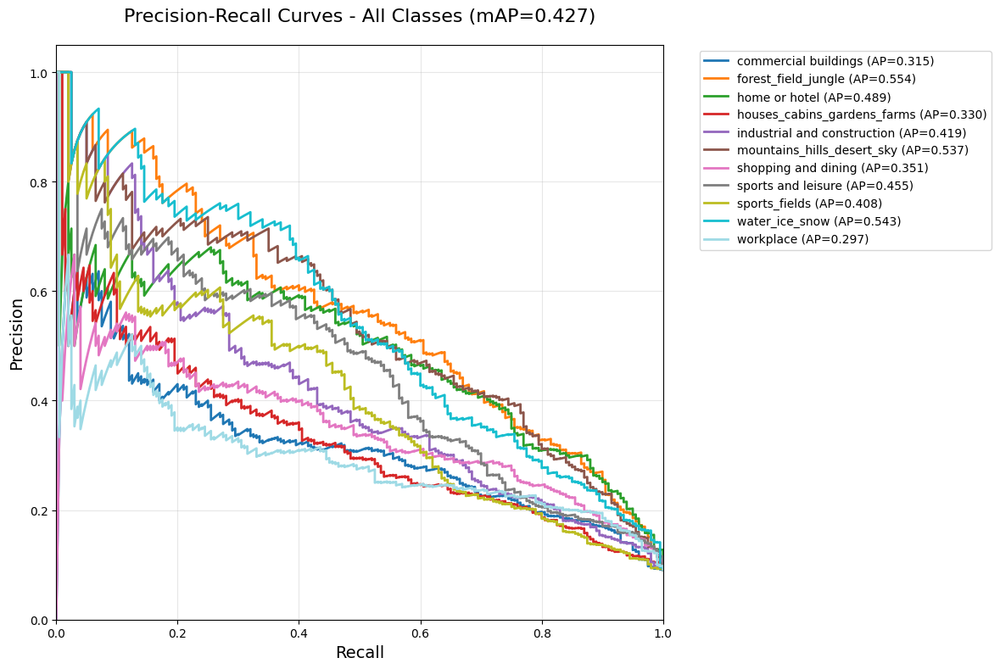

In [46]:
# Plot all PR curves on the same plot for comparison
plt.figure(figsize=(12, 8))

# Use a colormap for distinct colors
colors = plt.cm.tab20(np.linspace(0, 1, len(class_names)))

for i in range(len(class_names)):
    plt.plot(recall[i], precision[i], linewidth=2, color=colors[i],
             label=f'{class_names[i]} (AP={average_precision[i]:.3f})')

plt.xlabel('Recall', fontsize=14)
plt.ylabel('Precision', fontsize=14)
plt.title(f'Precision-Recall Curves - All Classes (mAP={np.mean(list(average_precision.values())):.3f})', 
          fontsize=16, pad=20)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.grid(alpha=0.3)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.tight_layout()
plt.show()

## ROC Curves

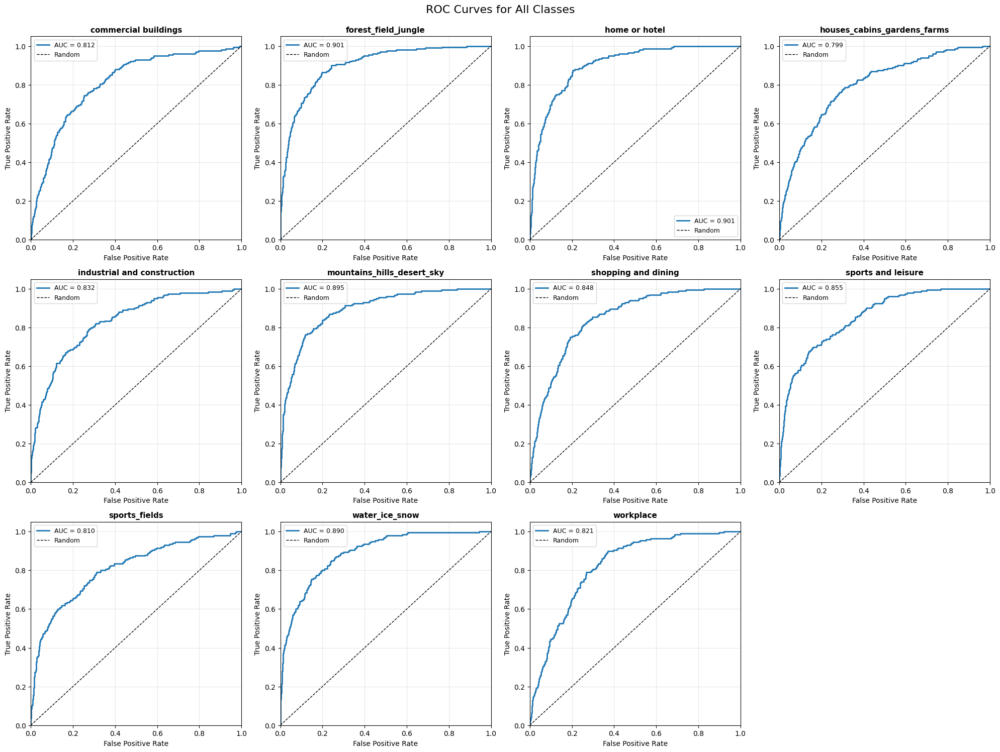


Area Under ROC Curve (AUC) Scores:
commercial buildings               : 0.8117
forest_field_jungle                : 0.9012
home or hotel                      : 0.9005
houses_cabins_gardens_farms        : 0.7989
industrial and construction        : 0.8316
mountains_hills_desert_sky         : 0.8950
shopping and dining                : 0.8480
sports and leisure                 : 0.8553
sports_fields                      : 0.8098
water_ice_snow                     : 0.8897
workplace                          : 0.8205

Mean AUC                           : 0.8511


In [47]:
# Compute ROC curves for all classes
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(len(class_names)):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], all_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves for all classes
fig, axes = plt.subplots(3, 4, figsize=(20, 15))
axes = axes.flatten()

for i in range(len(class_names)):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], linewidth=2, label=f'AUC = {roc_auc[i]:.3f}')
    ax.plot([0, 1], [0, 1], 'k--', linewidth=1, label='Random')
    ax.set_xlabel('False Positive Rate', fontsize=10)
    ax.set_ylabel('True Positive Rate', fontsize=10)
    ax.set_title(f'{class_names[i]}', fontsize=11, fontweight='bold')
    ax.legend(loc='best', fontsize=9)
    ax.grid(alpha=0.3)
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])

# Hide the last subplot (we have 11 classes, 12 subplots)
axes[-1].axis('off')

plt.suptitle('ROC Curves for All Classes', fontsize=16, y=0.995)
plt.tight_layout()
plt.show()

# Print AUC scores
print("\nArea Under ROC Curve (AUC) Scores:")
print("=" * 50)
for i, class_name in enumerate(class_names):
    print(f"{class_name:35s}: {roc_auc[i]:.4f}")
print(f"\n{'Mean AUC':35s}: {np.mean(list(roc_auc.values())):.4f}")

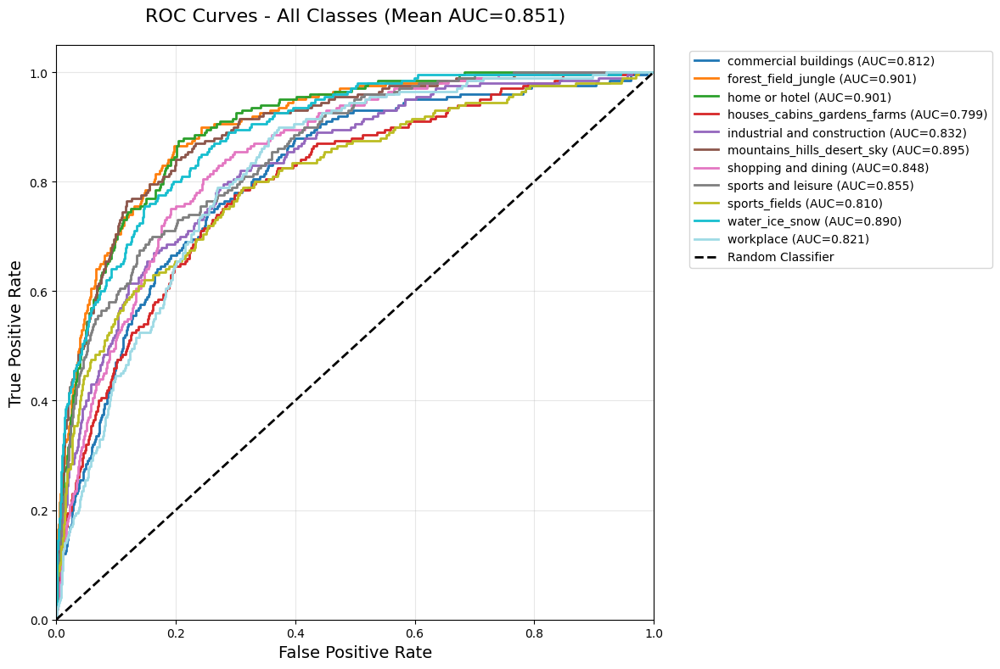

In [48]:
# Plot all ROC curves on the same plot for comparison
plt.figure(figsize=(12, 8))

# Use a colormap for distinct colors
colors = plt.cm.tab20(np.linspace(0, 1, len(class_names)))

for i in range(len(class_names)):
    plt.plot(fpr[i], tpr[i], linewidth=2, color=colors[i],
             label=f'{class_names[i]} (AUC={roc_auc[i]:.3f})')

# Plot random classifier line
plt.plot([0, 1], [0, 1], 'k--', linewidth=2, label='Random Classifier')

plt.xlabel('False Positive Rate', fontsize=14)
plt.ylabel('True Positive Rate', fontsize=14)
plt.title(f'ROC Curves - All Classes (Mean AUC={np.mean(list(roc_auc.values())):.3f})', 
          fontsize=16, pad=20)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.grid(alpha=0.3)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.tight_layout()
plt.show()

## Qualitative Visualizations - Correct Predictions

Total correct predictions: 948


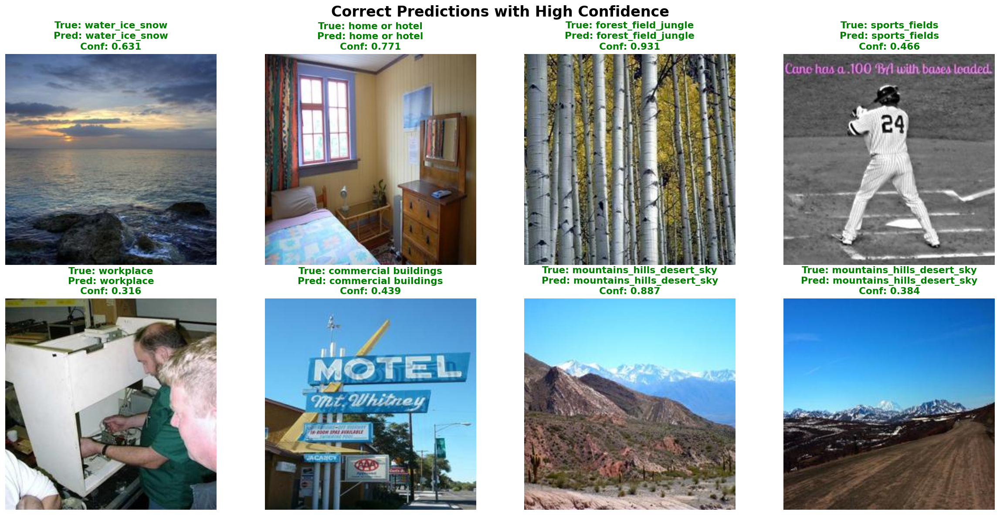

In [49]:
def denormalize_image(img_tensor):
    """Convert tensor back to displayable image."""
    img = img_tensor.cpu().numpy().transpose(1, 2, 0)
    img = np.clip(img, 0, 1)
    return img

def show_predictions(indices, title, num_samples=8):
    """Display sample predictions with their probabilities."""
    if len(indices) < num_samples:
        num_samples = len(indices)
    
    selected_indices = random.sample(list(indices), min(num_samples, len(indices)))
    
    rows = 2
    cols = 4
    fig, axes = plt.subplots(rows, cols, figsize=(20, 10), dpi=120)
    fig.suptitle(title, fontsize=20, y=0.98, fontweight='bold')
    
    for idx, ax in enumerate(axes.flat):
        if idx >= len(selected_indices):
            ax.axis('off')
            continue
            
        sample_idx = selected_indices[idx]
        
        # Get image from original dataset for better visualization
        img, true_label = test_dataset_original[sample_idx]
        pred_label = all_preds[sample_idx]
        probs = all_probs[sample_idx]
        
        # Display image
        ax.imshow(img)
        ax.axis('off')
        
        # Add labels and confidence
        true_class = class_names[true_label]
        pred_class = class_names[pred_label]
        confidence = probs[pred_label]
        
        color = 'green' if true_label == pred_label else 'red'
        ax.set_title(f"True: {true_class}\nPred: {pred_class}\nConf: {confidence:.3f}",
                    fontsize=13, color=color, fontweight='bold')
    
    plt.tight_layout()
    plt.show()

# Show correct predictions
correct_indices = np.where(all_preds == all_labels)[0]
print(f"Total correct predictions: {len(correct_indices)}")
show_predictions(correct_indices, "Correct Predictions with High Confidence")

## Qualitative Visualizations - Incorrect Predictions

Total incorrect predictions: 1252


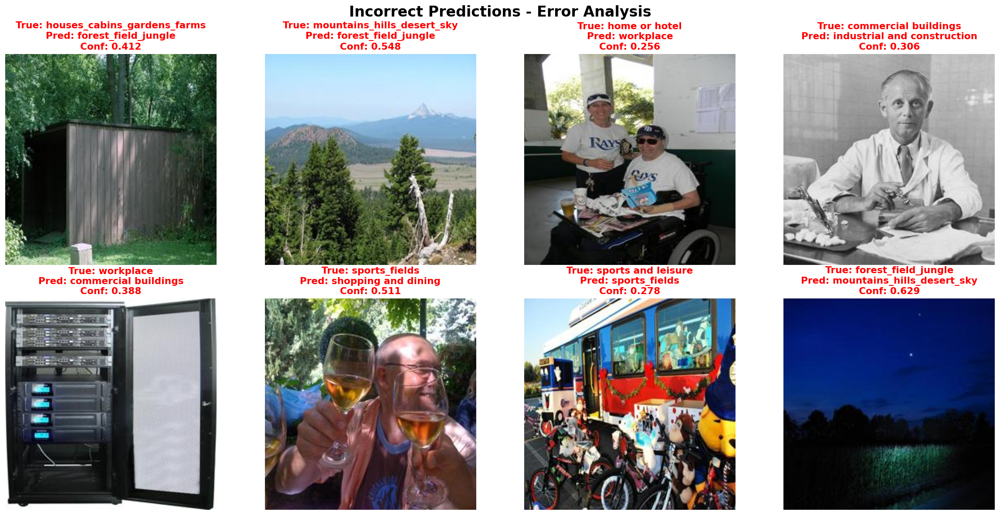

In [50]:
# Show incorrect predictions
incorrect_indices = np.where(all_preds != all_labels)[0]
print(f"Total incorrect predictions: {len(incorrect_indices)}")
show_predictions(incorrect_indices, "Incorrect Predictions - Error Analysis")

## Top Confident Predictions (Both Correct and Incorrect)

Most Confident Correct Predictions:
  forest_field_jungle: 0.9962
  forest_field_jungle: 0.9902
  forest_field_jungle: 0.9900
  sports_fields: 0.9851
  forest_field_jungle: 0.9749
  sports and leisure: 0.9706
  forest_field_jungle: 0.9631
  forest_field_jungle: 0.9562


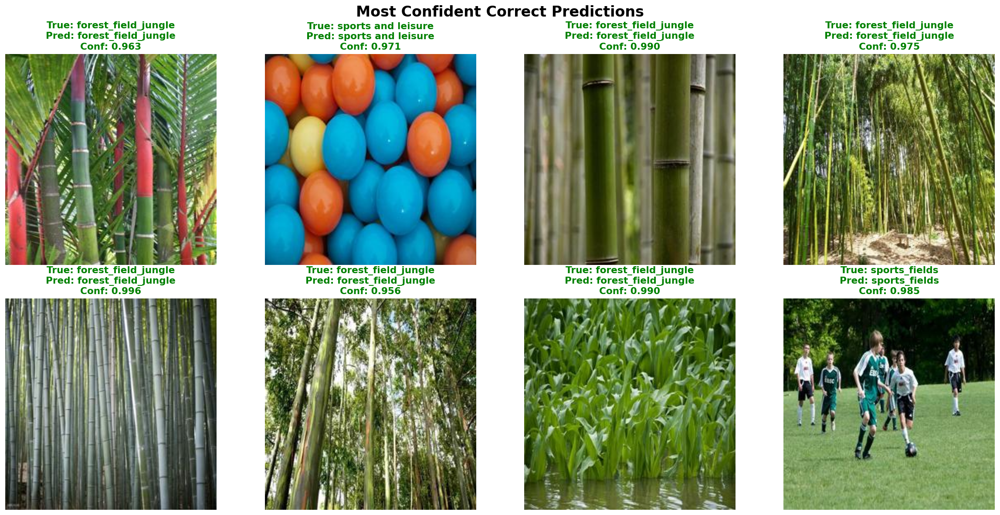


Most Confident Incorrect Predictions (Interesting Failures):
  True: mountains_hills_desert_sky, Pred: forest_field_jungle, Conf: 0.9654
  True: commercial buildings, Pred: home or hotel, Conf: 0.9081
  True: sports_fields, Pred: commercial buildings, Conf: 0.8988
  True: houses_cabins_gardens_farms, Pred: forest_field_jungle, Conf: 0.8963
  True: forest_field_jungle, Pred: sports_fields, Conf: 0.8728
  True: shopping and dining, Pred: sports and leisure, Conf: 0.8426
  True: industrial and construction, Pred: water_ice_snow, Conf: 0.8387
  True: houses_cabins_gardens_farms, Pred: forest_field_jungle, Conf: 0.8275


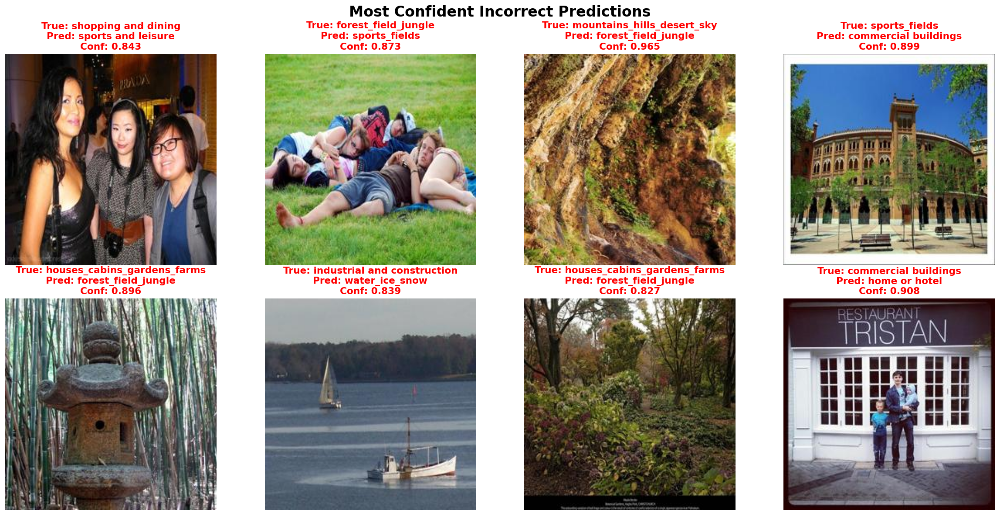

In [51]:
# Get prediction confidences
confidences = np.max(all_probs, axis=1)

# Most confident correct predictions
correct_mask = all_preds == all_labels
correct_confidences = confidences.copy()
correct_confidences[~correct_mask] = -1
top_correct = np.argsort(correct_confidences)[-8:][::-1]

print("Most Confident Correct Predictions:")
for idx in top_correct:
    print(f"  {class_names[all_labels[idx]]}: {confidences[idx]:.4f}")

show_predictions(top_correct, "Most Confident Correct Predictions")

# Most confident incorrect predictions (interesting failures)
incorrect_confidences = confidences.copy()
incorrect_confidences[correct_mask] = -1
top_incorrect = np.argsort(incorrect_confidences)[-8:][::-1]

if len(top_incorrect) > 0 and incorrect_confidences[top_incorrect[0]] > 0:
    print("\nMost Confident Incorrect Predictions (Interesting Failures):")
    for idx in top_incorrect:
        if incorrect_confidences[idx] > 0:
            print(f"  True: {class_names[all_labels[idx]]}, Pred: {class_names[all_preds[idx]]}, Conf: {confidences[idx]:.4f}")
    
    show_predictions(top_incorrect[incorrect_confidences[top_incorrect] > 0], 
                    "Most Confident Incorrect Predictions")

## Prediction Confidence Distribution

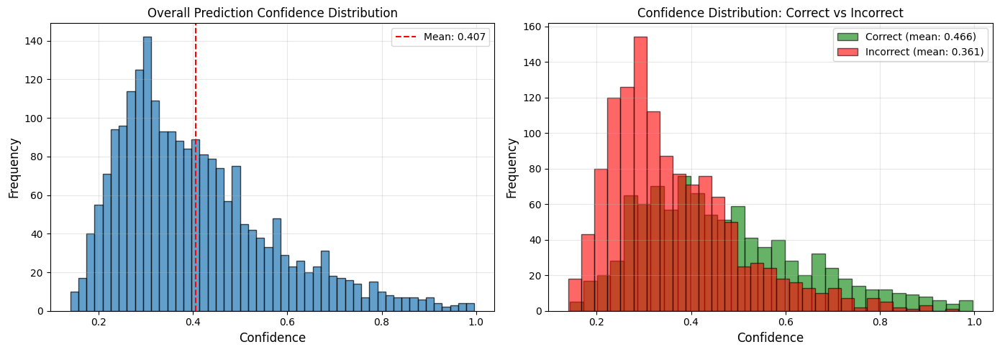


Confidence Statistics:
Overall mean confidence: 0.4065
Correct predictions mean confidence: 0.4665
Incorrect predictions mean confidence: 0.3611


In [52]:
# Plot confidence distribution
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Overall confidence distribution
axes[0].hist(confidences, bins=50, alpha=0.7, edgecolor='black')
axes[0].axvline(confidences.mean(), color='red', linestyle='--', label=f'Mean: {confidences.mean():.3f}')
axes[0].set_xlabel('Confidence', fontsize=12)
axes[0].set_ylabel('Frequency', fontsize=12)
axes[0].set_title('Overall Prediction Confidence Distribution', fontsize=12)
axes[0].legend()
axes[0].grid(alpha=0.3)

# Correct vs Incorrect confidence
correct_conf = confidences[all_preds == all_labels]
incorrect_conf = confidences[all_preds != all_labels]

axes[1].hist(correct_conf, bins=30, alpha=0.6, label=f'Correct (mean: {correct_conf.mean():.3f})', 
             color='green', edgecolor='black')
axes[1].hist(incorrect_conf, bins=30, alpha=0.6, label=f'Incorrect (mean: {incorrect_conf.mean():.3f})',
             color='red', edgecolor='black')
axes[1].set_xlabel('Confidence', fontsize=12)
axes[1].set_ylabel('Frequency', fontsize=12)
axes[1].set_title('Confidence Distribution: Correct vs Incorrect', fontsize=12)
axes[1].legend()
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print(f"\nConfidence Statistics:")
print(f"Overall mean confidence: {confidences.mean():.4f}")
print(f"Correct predictions mean confidence: {correct_conf.mean():.4f}")
print(f"Incorrect predictions mean confidence: {incorrect_conf.mean():.4f}")

## Most Confused Class Pairs

Most Confused Class Pairs:
workplace            misclassified as shopping and dining :  54 times
sports and leisure   misclassified as shopping and dining :  43 times
workplace            misclassified as home or hotel       :  39 times
commercial buildings misclassified as houses_cabins_gardens_farms:  35 times
shopping and dining  misclassified as sports and leisure  :  30 times
water_ice_snow       misclassified as mountains_hills_desert_sky:  29 times
home or hotel        misclassified as shopping and dining :  28 times
industrial and construction misclassified as houses_cabins_gardens_farms:  28 times
houses_cabins_gardens_farms misclassified as commercial buildings:  27 times
commercial buildings misclassified as industrial and construction:  25 times

Showing examples of workplace misclassified as shopping and dining:


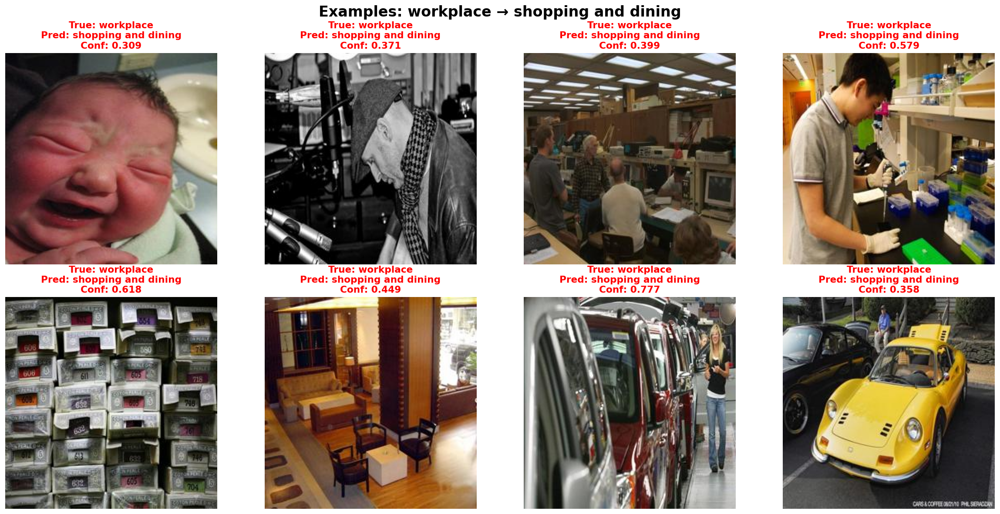

In [53]:
# Find most confused pairs (off-diagonal elements)
confusion_pairs = []
for i in range(len(class_names)):
    for j in range(len(class_names)):
        if i != j and cm[i, j] > 0:
            confusion_pairs.append((i, j, cm[i, j]))

# Sort by confusion count
confusion_pairs.sort(key=lambda x: x[2], reverse=True)

print("Most Confused Class Pairs:")
print("=" * 80)
for true_idx, pred_idx, count in confusion_pairs[:10]:
    print(f"{class_names[true_idx]:20s} misclassified as {class_names[pred_idx]:20s}: {count:3d} times")

# Show examples of the most confused pair
if len(confusion_pairs) > 0:
    top_true, top_pred, _ = confusion_pairs[0]
    confused_indices = np.where((all_labels == top_true) & (all_preds == top_pred))[0]
    
    print(f"\nShowing examples of {class_names[top_true]} misclassified as {class_names[top_pred]}:")
    show_predictions(confused_indices, 
                    f"Examples: {class_names[top_true]} → {class_names[top_pred]}")

## Model Summary

In [54]:
# Count parameters
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print("Model Summary:")
print("=" * 80)
print(f"Architecture: Pyramidal Dense Descriptor Classifier")
print(f"Checkpoint: {MODEL_PATH}")
print(f"Epoch: {checkpoint['epoch']}")
print(f"Total Parameters: {total_params:,}")
print(f"Trainable Parameters: {trainable_params:,}")
print(f"\nTest Set Performance:")
print(f"Accuracy: {accuracy:.4f} ({accuracy*100:.2f}%)")
print(f"Correct Predictions: {len(correct_indices)}/{len(all_labels)}")
print(f"Incorrect Predictions: {len(incorrect_indices)}/{len(all_labels)}")

Model Summary:
Architecture: Pyramidal Dense Descriptor Classifier
Checkpoint: ../trained_models/pyramidal_gran_normal/best_test_accuracy.pt
Epoch: 265
Total Parameters: 6,750,475
Trainable Parameters: 6,750,475

Test Set Performance:
Accuracy: 0.4309 (43.09%)
Correct Predictions: 948/2200
Incorrect Predictions: 1252/2200
